# Trabalho - Grupo 3

## Top songs spotify - 2010 a 2019

### Perguntas:

#### 1- Qual o gênero e o artista mais tocado?

--> Sub análise por ano

#### 2- Qual a preferência das pessoas: música cantada ou instrumental? música acustica ou eletrônica?

#### 3- Qual a faixa de bpm mais escutada? 

--> Por faixa

--> Média e desvio padrão (quanto varia essa preferência)

#### 4- Quantas músicas são de sofrência e quantas são mais felizes?

#### 5- Qual a relação entre a energia da música, os dB e o bpm?

#### 6- Qual a relação entre a dançabilidade da música e a popularidade? 

#### 7- Qual a duração preferida por ano?

#### 8- Qual o máximo de anos que uma música permaneceu no top?

Link: https://www.kaggle.com/datasets/muhmores/spotify-top-100-songs-of-20152019?select=Spotify+2010+-+2019+Top+100.csv


In [78]:
import pandas as pd
import numpy as np
import os

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [79]:
os.listdir()

['top10s.csv', 'Grupo3.ipynb', '.ipynb_checkpoints']

In [80]:
df = pd.read_csv('top10s.csv', encoding='latin-1')

In [81]:
df.head()

,Unnamed: 0,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,1,"Hey, Soul Sister",Train,neo mellow,2010,97,89,67,-4,8,80,217,19,4,83
1,2,Love The Way You Lie,Eminem,detroit hip hop,2010,87,93,75,-5,52,64,263,24,23,82
2,3,TiK ToK,Kesha,dance pop,2010,120,84,76,-3,29,71,200,10,14,80
3,4,Bad Romance,Lady Gaga,dance pop,2010,119,92,70,-4,8,71,295,0,4,79
4,5,Just the Way You Are,Bruno Mars,pop,2010,109,84,64,-5,9,43,221,2,4,78


In [82]:
#Tirando a 1a coluna que era o index
df.drop(["Unnamed: 0"], axis=1, inplace=True)

In [83]:
df.head()

,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,"Hey, Soul Sister",Train,neo mellow,2010,97,89,67,-4,8,80,217,19,4,83
1,Love The Way You Lie,Eminem,detroit hip hop,2010,87,93,75,-5,52,64,263,24,23,82
2,TiK ToK,Kesha,dance pop,2010,120,84,76,-3,29,71,200,10,14,80
3,Bad Romance,Lady Gaga,dance pop,2010,119,92,70,-4,8,71,295,0,4,79
4,Just the Way You Are,Bruno Mars,pop,2010,109,84,64,-5,9,43,221,2,4,78


In [84]:
# não possui nenhum valor nulo

#3 variáveis categóricas
#o resto numérica

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 603 entries, 0 to 602
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   title      603 non-null    object
 1   artist     603 non-null    object
 2   top genre  603 non-null    object
 3   year       603 non-null    int64 
 4   bpm        603 non-null    int64 
 5   nrgy       603 non-null    int64 
 6   dnce       603 non-null    int64 
 7   dB         603 non-null    int64 
 8   live       603 non-null    int64 
 9   val        603 non-null    int64 
 10  dur        603 non-null    int64 
 11  acous      603 non-null    int64 
 12  spch       603 non-null    int64 
 13  pop        603 non-null    int64 
dtypes: int64(11), object(3)
memory usage: 66.1+ KB


In [155]:
df.describe()

,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000
mean,2014.592040,118.545605,70.504146,64.379768,-5.578773,17.774461,52.225539,224.674959,14.326700,8.358209,66.520730
std,2.607057,24.795358,16.310664,13.378718,2.798020,13.102543,22.513020,34.130059,20.766165,7.483162,14.517746
min,2010.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,134.000000,0.000000,0.000000,0.000000
25%,2013.000000,100.000000,61.000000,57.000000,-6.000000,9.000000,35.000000,202.000000,2.000000,4.000000,60.000000
50%,2015.000000,120.000000,74.000000,66.000000,-5.000000,12.000000,52.000000,221.000000,6.000000,5.000000,69.000000
75%,2017.000000,129.000000,82.000000,73.000000,-4.000000,24.000000,69.000000,239.500000,17.000000,9.000000,76.000000
max,2019.000000,206.000000,98.000000,97.000000,-2.000000,74.000000,98.000000,424.000000,99.000000,48.000000,99.000000


In [184]:
for i in years:
    display(df[df.year == i].describe())

,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,51.0,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,2010.0,122.058824,77.901961,64.529412,-4.901961,21.176471,57.000000,229.803922,11.627451,8.882353,64.254902
std,0.0,25.308032,14.953601,14.412984,1.360219,17.120404,22.001818,33.858541,19.993960,9.322332,13.227007
min,2010.0,43.000000,37.000000,23.000000,-8.000000,4.000000,7.000000,172.000000,0.000000,3.000000,0.000000
25%,2010.0,111.500000,73.500000,56.500000,-5.500000,9.000000,43.500000,207.500000,1.000000,4.000000,59.000000
50%,2010.0,125.000000,82.000000,67.000000,-5.000000,13.000000,61.000000,221.000000,3.000000,5.000000,65.000000
75%,2010.0,130.500000,87.000000,75.000000,-4.000000,31.500000,74.000000,252.000000,14.500000,10.000000,73.000000
max,2010.0,186.000000,98.000000,83.000000,-2.000000,70.000000,88.000000,329.000000,85.000000,45.000000,83.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,53.0,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000
mean,2011.0,119.075472,74.886792,63.641509,-5.018868,20.943396,53.698113,242.566038,13.339623,9.660377,61.867925
std,0.0,20.946681,15.548510,11.267882,1.434339,15.083632,20.835053,36.942528,21.341494,9.169228,16.058831
min,2011.0,63.000000,33.000000,30.000000,-9.000000,5.000000,9.000000,197.000000,0.000000,3.000000,7.000000
25%,2011.0,105.000000,70.000000,59.000000,-6.000000,11.000000,38.000000,220.000000,1.000000,4.000000,58.000000
50%,2011.0,126.000000,78.000000,65.000000,-5.000000,14.000000,57.000000,231.000000,5.000000,5.000000,66.000000
75%,2011.0,130.000000,86.000000,71.000000,-4.000000,29.000000,69.000000,262.000000,14.000000,14.000000,73.000000
max,2011.0,175.000000,95.000000,82.000000,-3.000000,67.000000,89.000000,379.000000,91.000000,39.000000,81.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,35.0,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.00000,35.000000
mean,2012.0,121.085714,75.485714,65.714286,-4.857143,15.828571,64.171429,224.400000,4.857143,5.80000,67.771429
std,0.0,21.066242,12.134955,9.838614,1.458098,10.427581,19.008490,24.236822,9.953252,2.65463,14.528037
min,2012.0,77.000000,47.000000,38.000000,-7.000000,3.000000,20.000000,171.000000,0.000000,3.00000,0.000000
25%,2012.0,109.000000,68.000000,60.000000,-6.000000,8.000000,50.500000,208.500000,0.000000,4.00000,65.500000
50%,2012.0,125.000000,79.000000,67.000000,-5.000000,12.000000,68.000000,225.000000,2.000000,5.00000,72.000000
75%,2012.0,128.000000,84.500000,72.000000,-4.000000,23.500000,77.500000,239.500000,5.000000,7.50000,75.500000
max,2012.0,184.000000,96.000000,86.000000,-2.000000,39.000000,95.000000,279.000000,50.000000,14.00000,80.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,71.0,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000
mean,2013.0,121.676056,73.873239,62.042254,-5.140845,19.718310,53.183099,234.492958,10.323944,8.309859,63.985915
std,0.0,26.517258,15.396595,11.580077,1.658707,14.007328,21.234951,42.506427,15.660482,7.652435,12.864673
min,2013.0,77.000000,23.000000,28.000000,-11.000000,4.000000,7.000000,157.000000,0.000000,3.000000,28.000000
25%,2013.0,102.500000,66.000000,55.000000,-6.000000,10.000000,37.500000,209.000000,1.000000,4.000000,55.500000
50%,2013.0,126.000000,78.000000,63.000000,-5.000000,13.000000,52.000000,227.000000,4.000000,5.000000,67.000000
75%,2013.0,130.000000,84.000000,69.000000,-4.000000,31.000000,67.500000,249.000000,13.500000,9.500000,74.000000
max,2013.0,201.000000,98.000000,85.000000,-2.000000,66.000000,91.000000,424.000000,92.000000,48.000000,88.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,58.0,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000
mean,2014.0,123.000000,67.775862,62.534483,-5.775862,17.293103,52.086207,224.155172,17.551724,8.672414,62.706897
std,0.0,26.168147,18.468601,14.486794,1.864188,9.702611,25.053826,32.675868,24.110253,8.200103,15.545077
min,2014.0,75.000000,14.000000,29.000000,-12.000000,5.000000,4.000000,160.000000,0.000000,3.000000,0.000000
25%,2014.0,104.750000,59.250000,51.500000,-7.000000,10.000000,33.000000,202.000000,2.000000,4.000000,56.000000
50%,2014.0,125.000000,72.000000,63.500000,-6.000000,13.500000,54.000000,223.500000,8.000000,5.000000,65.000000
75%,2014.0,136.500000,80.000000,72.000000,-5.000000,26.500000,69.750000,240.750000,21.000000,8.750000,72.750000
max,2014.0,192.000000,95.000000,96.000000,-3.000000,38.000000,98.000000,323.000000,97.000000,42.000000,86.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,95.0,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000
mean,2015.0,119.768421,70.336842,63.663158,-5.621053,18.305263,52.526316,223.368421,16.600000,7.052632,64.568421
std,0.0,26.789746,15.790255,15.005397,1.638493,13.969628,24.575910,31.089457,23.090663,5.617920,14.352443
min,2015.0,77.000000,26.000000,26.000000,-11.000000,3.000000,4.000000,134.000000,0.000000,3.000000,0.000000
25%,2015.0,100.000000,61.000000,57.000000,-7.000000,9.000000,34.000000,202.500000,2.000000,4.000000,57.000000
50%,2015.0,120.000000,75.000000,67.000000,-5.000000,13.000000,52.000000,220.000000,6.000000,5.000000,68.000000
75%,2015.0,128.000000,81.500000,74.500000,-4.000000,25.500000,74.000000,235.500000,24.500000,8.000000,74.500000
max,2015.0,206.000000,95.000000,90.000000,-3.000000,69.000000,96.000000,320.000000,88.000000,44.000000,84.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,80.0,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000
mean,2016.0,114.325000,67.237500,63.325000,-6.712500,17.737500,45.150000,220.225000,15.875000,8.362500,64.162500
std,0.0,24.059933,18.687465,14.102496,6.334942,13.144517,21.101383,32.699234,23.247363,6.531799,16.237512
min,2016.0,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,166.000000,0.000000,0.000000,0.000000
25%,2016.0,100.000000,59.000000,57.000000,-7.000000,9.000000,30.000000,199.750000,2.000000,4.000000,57.000000
50%,2016.0,113.000000,71.000000,63.000000,-6.000000,13.000000,43.000000,217.500000,5.500000,6.000000,69.000000
75%,2016.0,124.000000,80.000000,73.000000,-5.000000,23.750000,60.250000,234.000000,17.000000,10.250000,77.250000
max,2016.0,186.000000,95.000000,93.000000,-3.000000,74.000000,90.000000,403.000000,99.000000,44.000000,84.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,65.0,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000
mean,2017.0,116.800000,69.169231,65.369231,-5.615385,15.369231,52.276923,222.169231,16.600000,9.784615,69.015385
std,0.0,27.667784,15.353714,13.759734,1.868257,10.263055,21.697140,28.243677,20.081708,9.148928,10.982219
min,2017.0,73.000000,28.000000,27.000000,-11.000000,4.000000,9.000000,158.000000,0.000000,3.000000,41.000000
25%,2017.0,100.000000,59.000000,59.000000,-7.000000,9.000000,34.000000,202.000000,3.000000,4.000000,62.000000
50%,2017.0,106.000000,72.000000,68.000000,-5.000000,12.000000,54.000000,222.000000,9.000000,6.000000,71.000000
75%,2017.0,124.000000,81.000000,74.000000,-4.000000,18.000000,66.000000,238.000000,20.000000,11.000000,77.000000
max,2017.0,192.000000,93.000000,93.000000,-2.000000,49.000000,93.000000,289.000000,88.000000,38.000000,87.000000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,64.0,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.00000
mean,2018.0,114.593750,65.468750,67.203125,-5.671875,14.750000,48.765625,217.187500,12.781250,8.625000,72.43750
std,0.0,22.458935,12.989579,13.148939,1.426002,10.222912,21.838325,33.112063,17.942119,6.913295,9.87039
min,2018.0,77.000000,30.000000,26.000000,-10.000000,2.000000,10.000000,164.000000,0.000000,3.000000,44.00000
25%,2018.0,97.750000,59.000000,58.750000,-7.000000,9.000000,32.000000,194.750000,3.000000,5.000000,66.75000
50%,2018.0,110.000000,67.000000,67.500000,-6.000000,11.500000,47.500000,211.500000,5.000000,6.000000,74.50000
75%,2018.0,125.250000,74.250000,76.000000,-5.000000,16.250000,62.250000,226.250000,16.500000,9.000000,80.25000
max,2018.0,180.000000,87.000000,97.000000,-3.000000,64.000000,97.000000,341.000000,81.000000,37.000000,86.00000


,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,31.0,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,2019.0,112.451613,64.741935,69.709677,-5.774194,15.161290,50.806452,200.645161,21.741935,8.129032,84.354839
std,0.0,19.438516,17.395340,11.498387,1.802030,14.154144,22.660420,26.700248,22.492914,7.017796,8.292761
min,2019.0,91.000000,32.000000,48.000000,-9.000000,4.000000,9.000000,148.000000,1.000000,3.000000,67.000000
25%,2019.0,97.000000,50.500000,61.500000,-7.000000,8.000000,35.000000,181.500000,6.500000,3.500000,79.500000
50%,2019.0,104.000000,68.000000,70.000000,-6.000000,10.000000,52.000000,202.000000,13.000000,5.000000,85.000000
75%,2019.0,125.000000,79.000000,78.000000,-5.000000,15.000000,63.500000,215.500000,25.500000,10.000000,90.000000
max,2019.0,158.000000,89.000000,90.000000,-3.000000,74.000000,95.000000,261.000000,84.000000,34.000000,99.000000


In [157]:
df[df['bpm'] != 0].describe()

,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
count,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000
mean,2014.589701,118.742525,70.621262,64.486711,-5.488372,17.803987,52.312292,224.671096,14.350498,8.372093,66.631229
std,2.608592,24.339497,16.068471,13.129357,1.704657,13.093347,22.430640,34.158310,20.775203,7.481608,14.273775
min,2010.000000,43.000000,4.000000,23.000000,-15.000000,2.000000,4.000000,134.000000,0.000000,3.000000,0.000000
25%,2013.000000,100.000000,61.000000,57.000000,-6.000000,9.000000,35.000000,202.000000,2.000000,4.000000,60.000000
50%,2015.000000,120.000000,74.000000,66.000000,-5.000000,12.000000,52.000000,220.500000,6.000000,5.000000,69.000000
75%,2017.000000,129.000000,82.000000,73.000000,-4.000000,24.000000,69.000000,239.750000,17.000000,9.000000,76.000000
max,2019.000000,206.000000,98.000000,97.000000,-2.000000,74.000000,98.000000,424.000000,99.000000,48.000000,99.000000


In [154]:
#Discussão
df[df['pop'] == 0]

,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
50,Hello,Martin Solveig,big room,2010,128,98,67,-3,10,45,191,1,3,0
138,Blow Me (One Last Kiss),P!nk,dance pop,2012,114,92,60,-3,25,75,256,0,4,0
267,Not a Bad Thing,Justin Timberlake,dance pop,2014,86,73,59,-6,38,46,266,27,6,0
362,L.A.LOVE (la la),Fergie,dance pop,2015,202,39,48,-8,26,27,193,2,9,0
442,Million Years Ago,Adele,british soul,2016,0,0,0,-60,0,0,227,0,0,0


In [85]:
#Não possui linhas duplicadas

df[df.duplicated()]

,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop


In [86]:
from collections import Counter
print(Counter(df[df.duplicated(['title'], keep=False)].title))

df[df.duplicated(['title'])]


Counter({'Just the Way You Are': 2, 'Marry You': 2, 'I Like It': 2, 'Written in the Stars (feat. Eric Turner)': 2, 'Castle Walls (feat. Christina Aguilera)': 2, 'Hello': 2, 'We Are Never Ever Getting Back Together': 2, 'A Little Party Never Killed Nobody (All We Got)': 2, 'Say Something': 2, 'The Hills': 2, 'Love Yourself': 2, 'Sugar': 2, 'Stitches': 2, 'Company': 2, "Runnin' (Lose It All)": 2, 'Here': 2, 'All I Ask': 2, 'First Time': 2, 'Kissing Strangers': 2})


,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
54,Just the Way You Are,Bruno Mars,pop,2011,109,84,64,-5,9,43,221,2,4,78
64,Marry You,Bruno Mars,pop,2011,145,83,62,-5,10,48,230,33,4,73
93,Written in the Stars (feat. Eric Turner),Tinie Tempah,dance pop,2011,91,95,64,-4,18,57,220,6,7,52
95,Castle Walls (feat. Christina Aguilera),T.I.,atl hip hop,2011,80,86,45,-5,26,58,329,7,39,49
152,We Are Never Ever Getting Back Together,Taylor Swift,pop,2013,86,68,63,-6,12,75,193,1,9,75
239,A Little Party Never Killed Nobody (All We Got),Fergie,dance pop,2014,130,62,76,-6,9,52,241,1,18,65
295,Hello,Adele,british soul,2015,158,45,48,-6,9,29,295,34,3,73
322,Sugar,Maroon 5,pop,2015,120,79,75,-7,9,88,235,6,3,66
363,The Hills,The Weeknd,canadian contemporary r&b,2016,113,56,58,-7,14,14,242,7,5,84
364,Love Yourself,Justin Bieber,canadian pop,2016,100,38,61,-10,28,52,234,84,44,83


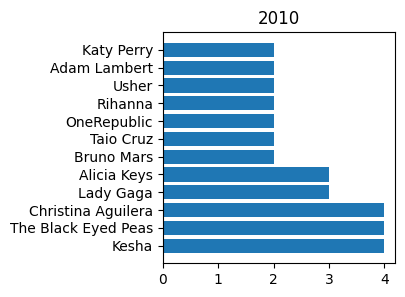

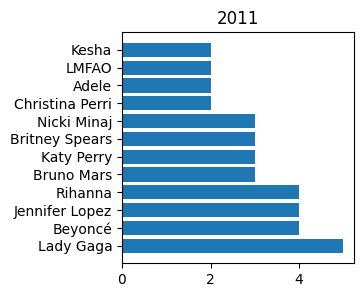

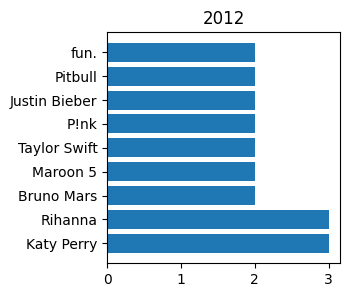

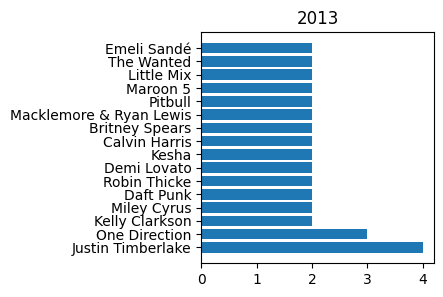

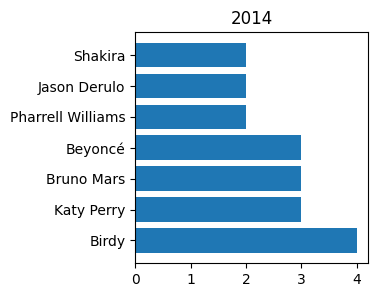

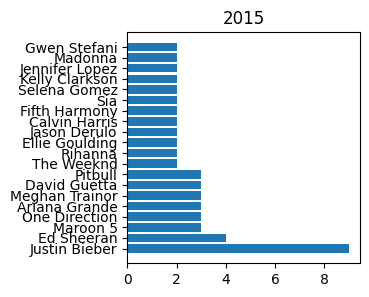

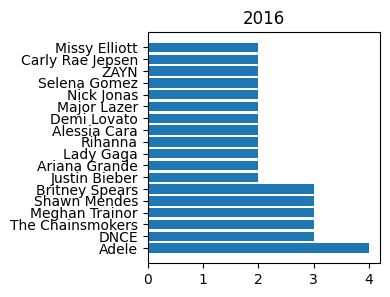

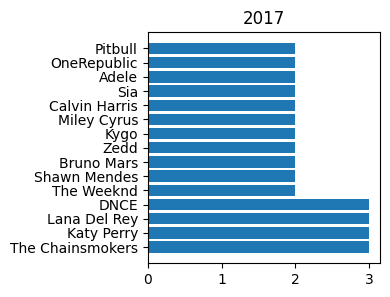

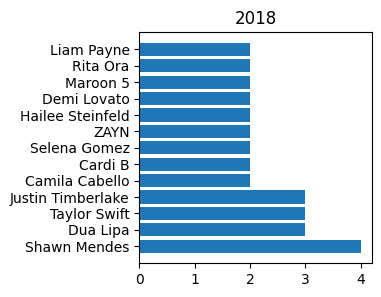

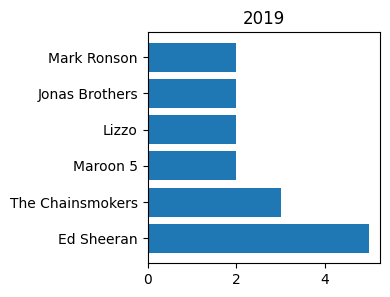

In [118]:
from collections import Counter, OrderedDict

years = df.year.unique()

for i in years:
    df_teste = df.copy()
    df_teste = df_teste[df_teste.year==i]
    count = OrderedDict(Counter(df_teste[df_teste.duplicated(['artist'], keep=False)].artist).most_common())
    plt.figure(figsize=(3, 3))
    plt.title(f"{i}")
    plt.barh(list(count.keys()), count.values())


<BarContainer object of 111 artists>

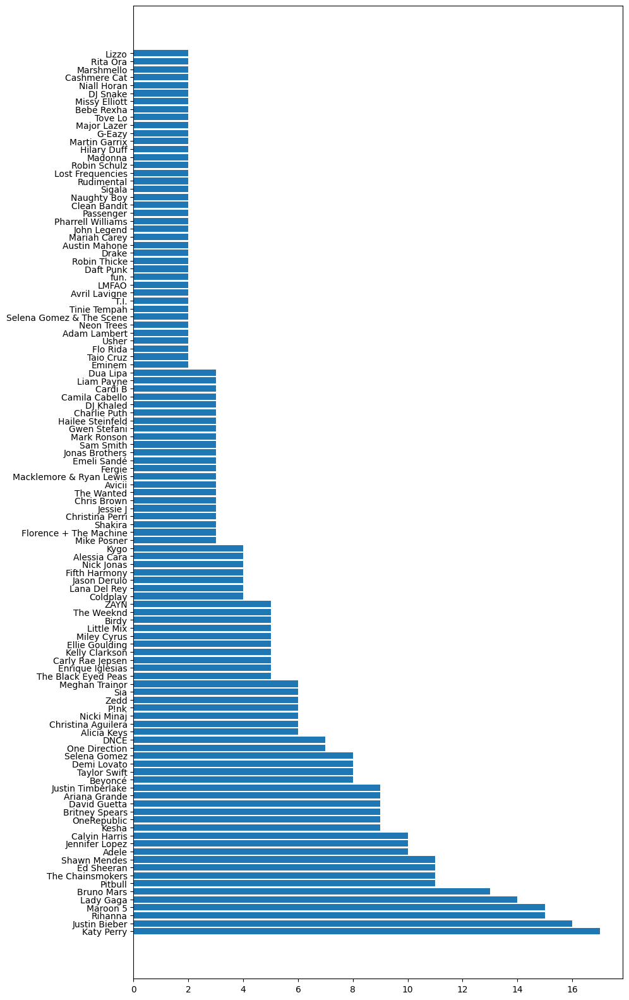

In [119]:
from collections import Counter, OrderedDict
count = OrderedDict(Counter(df[df.duplicated(['artist'], keep=False)].artist).most_common())
plt.figure(figsize=(10, 20))
plt.barh(list(count.keys()), count.values())

#df[df.duplicated(['artist'])]

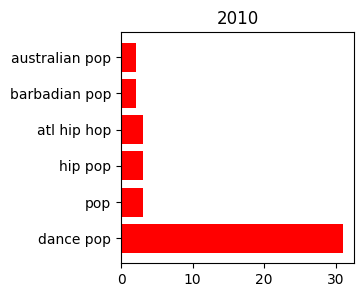

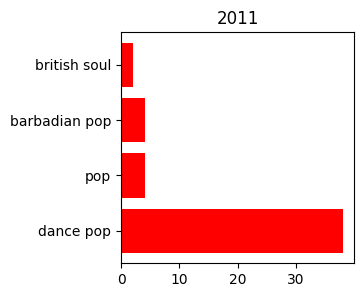

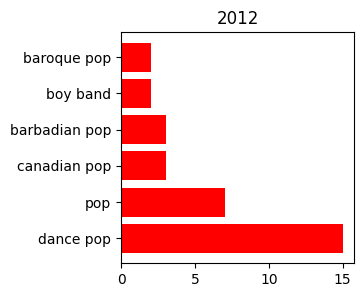

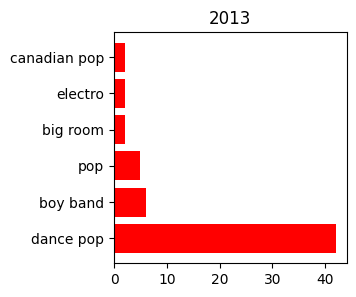

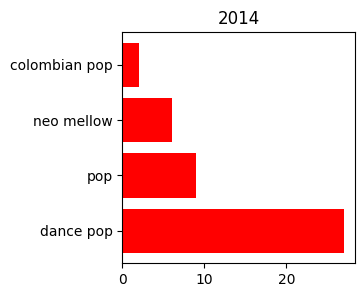

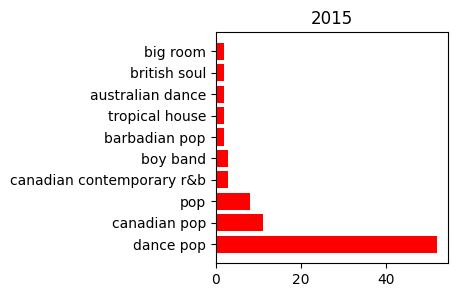

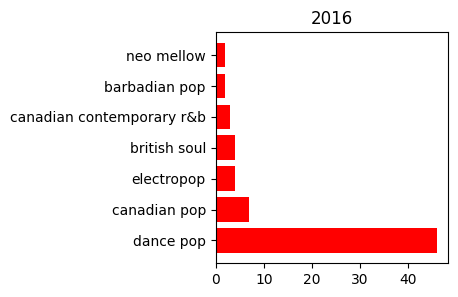

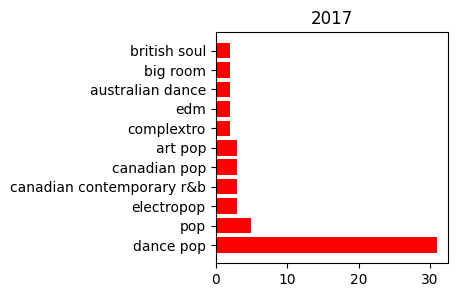

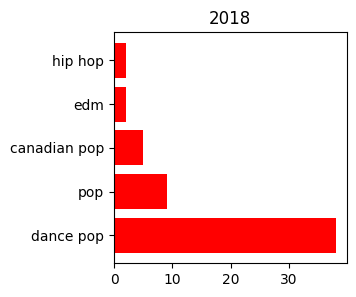

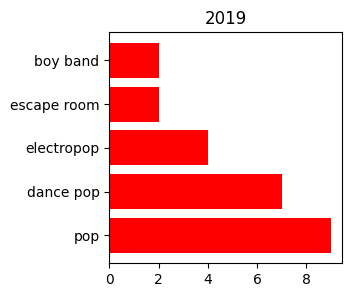

In [121]:
from collections import Counter, OrderedDict

years = df.year.unique()

for i in years:
    df_teste = df.copy()
    df_teste = df_teste[df_teste.year==i]
    count = OrderedDict(Counter(df_teste[df_teste.duplicated(['top genre'], keep=False)]['top genre']).most_common())
    plt.figure(figsize=(3, 3))
    plt.title(f"{i}")
    plt.barh(list(count.keys()), count.values(), color='red')

<BarContainer object of 50 artists>

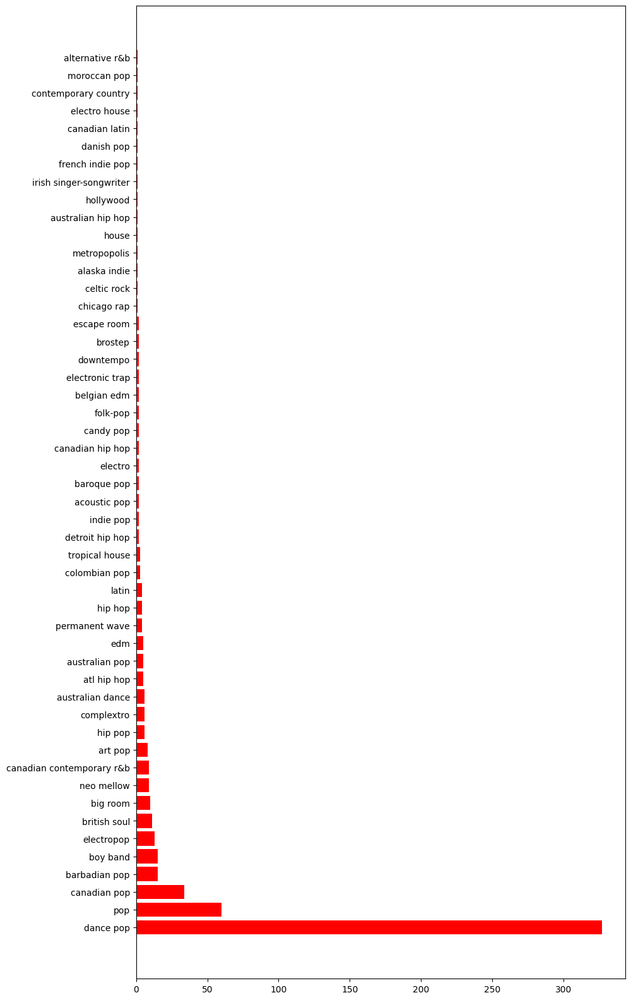

In [127]:

count = OrderedDict(Counter(df['top genre']).most_common())
plt.figure(figsize=(10, 20))
plt.barh(list(count.keys()), count.values(), color='red')


In [124]:
df[df['top genre'] == 'escape room']

,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
580,Truth Hurts,Lizzo,escape room,2019,158,62,72,-3,12,41,173,11,11,90
581,Good as Hell (feat. Ariana Grande) - Remix,Lizzo,escape room,2019,96,89,67,-3,74,48,159,30,6,90


In [138]:
print(df[df['top genre'].str.contains('pop')]['top genre'].unique())
print(len(df[df['top genre'].str.contains('pop')]['top genre'])/len(df))

print(df[df['top genre'] == 'dance pop']['top genre'].unique())
print(len(df[df['top genre'] == 'dance pop']['top genre'])/len(df))


['dance pop' 'pop' 'canadian pop' 'hip pop' 'barbadian pop'
 'australian pop' 'indie pop' 'art pop' 'colombian pop' 'acoustic pop'
 'baroque pop' 'candy pop' 'folk-pop' 'metropopolis' 'electropop'
 'french indie pop' 'danish pop' 'moroccan pop']
0.8043117744610282
['dance pop']
0.5422885572139303


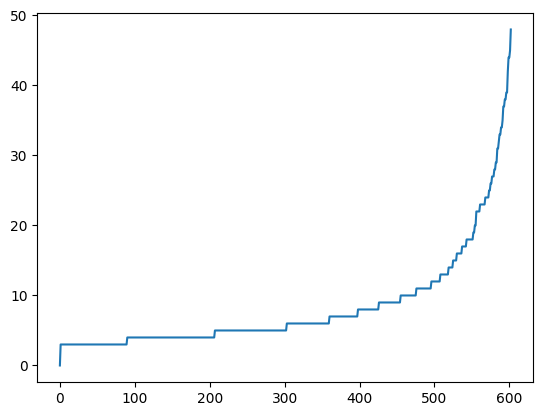

In [158]:
#75% percentil


plt.plot(sorted(list(df['spch'])))

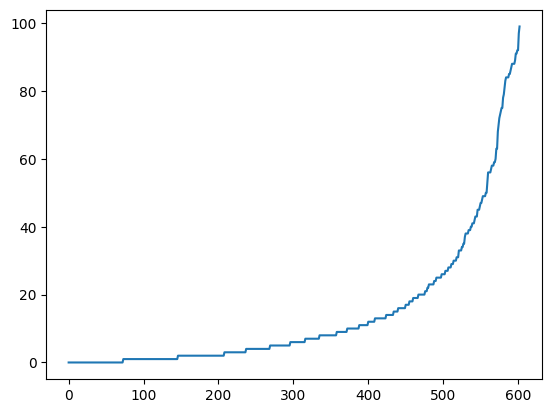

In [161]:
#75% percentil


plt.plot(sorted(list(df['acous'])))

(array([  1.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   2.,   3.,
         22.,  22.,  60.,  61.,  49.,  45.,  90., 128.,  22.,  25.,  21.,
          5.,  15.,   4.,   7.,   7.,  10.,   0.,   3.]),
 array([  0.        ,   6.86666667,  13.73333333,  20.6       ,
         27.46666667,  34.33333333,  41.2       ,  48.06666667,
         54.93333333,  61.8       ,  68.66666667,  75.53333333,
         82.4       ,  89.26666667,  96.13333333, 103.        ,
        109.86666667, 116.73333333, 123.6       , 130.46666667,
        137.33333333, 144.2       , 151.06666667, 157.93333333,
        164.8       , 171.66666667, 178.53333333, 185.4       ,
        192.26666667, 199.13333333, 206.        ]),
 <BarContainer object of 30 artists>)

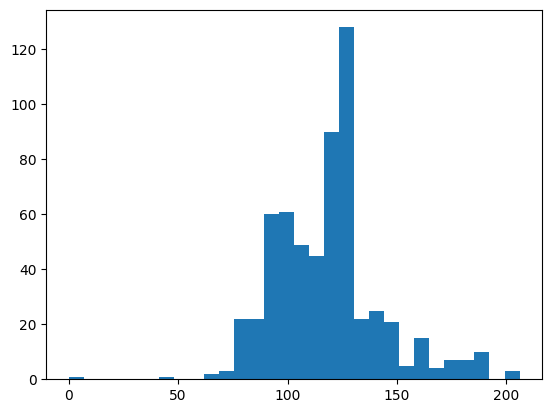

In [164]:
#preferência: andamento musical allegro

plt.hist(list(df.bpm), bins=30) 

(array([ 1.,  2., 14.,  8., 16., 11., 13., 26., 20., 15., 32., 25., 23.,
        33., 24., 42., 25., 28., 32., 35., 23., 14., 35., 16., 21., 17.,
        24., 12.,  9.,  7.]),
 array([ 0.        ,  3.26666667,  6.53333333,  9.8       , 13.06666667,
        16.33333333, 19.6       , 22.86666667, 26.13333333, 29.4       ,
        32.66666667, 35.93333333, 39.2       , 42.46666667, 45.73333333,
        49.        , 52.26666667, 55.53333333, 58.8       , 62.06666667,
        65.33333333, 68.6       , 71.86666667, 75.13333333, 78.4       ,
        81.66666667, 84.93333333, 88.2       , 91.46666667, 94.73333333,
        98.        ]),
 <BarContainer object of 30 artists>)

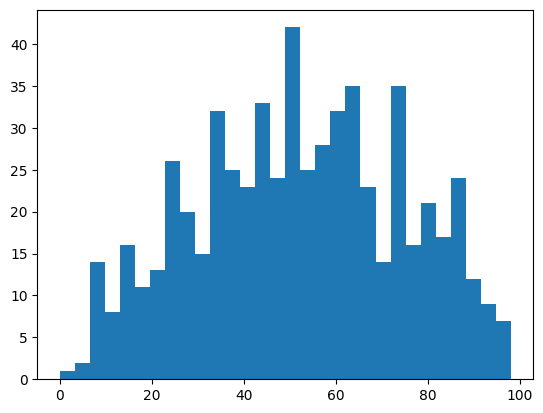

In [165]:
#preferência: neutro e varia 

plt.hist(list(df.val), bins=30) 

/tmp/ipykernel_431970/105526548.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f')


<AxesSubplot: >

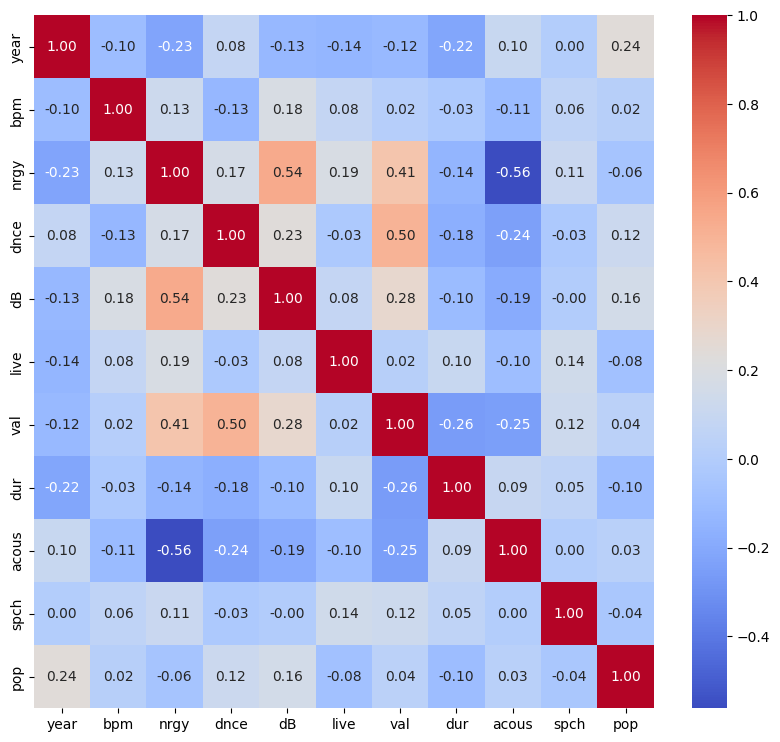

In [181]:
plt.figure(figsize=(10, 9))
sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f')

#Entre 0.7e 0.89:  correlação forte; Entre 0.40 e 0.69:  correlação moderada;  Entre 0.1 e 0.39:correlação fraca; (Vermelho)- correlação desprezível


#Correlação moderada positiva entre energia e dB (0.54), entre dance e val (0.50) e entre val e energia (0.41).
#Correlação moderada negativa entre energia e acustica(-0.56)

#A variável popularidade n tem a ver com nada.
#O bbm não tem a ver com nada -para descobrir as variáveis, não foi usado o bbm



In [44]:
from pandas_profiling import ProfileReport
profile_report = ProfileReport(df)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]